In [1]:
%matplotlib inline
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from glob import glob
from scipy.io import loadmat # for reading weird matlab files
from skimage.io import imread
from skimage.util.montage import montage2d
import matplotlib.pyplot as plt


In [2]:
curr_dir = os.getcwd()
base_dir = os.path.join(curr_dir,'input')
spie_imgs = glob(os.path.join(base_dir, 'spie_oct', '*.mat'))+glob(os.path.join(base_dir, 'spie_oct', '*.jpg'))
heid_imgs = glob(os.path.join(base_dir, 'data', '*','*.mat'))

oct_seg = glob(os.path.join(base_dir, 
                                            'Rabbani_IOVS_2015', 
                                            'Expert_Markings','*.tif'))
out_seg_images = glob(os.path.join(base_dir,  
                                            'Rabbani_IOVS_2015', 
                                            'Early*', '*','*.tif'))
print('SPIE Image Count', len(spie_imgs))
print('Heidelberg Image Count', len(heid_imgs))
print('Segmented Images', len(oct_seg), len(out_seg_images))
print (base_dir)

SPIE Image Count 28
Heidelberg Image Count 579
Segmented Images 72 24
/Users/vaishalilambe/Documents/DataScienceUsingPython/input


# SPIE Data
### Full OCT scan and Fundus Images

In [3]:
spie_df = pd.DataFrame(dict(path = spie_imgs))
spie_df['file_id'] = spie_df['path'].map(lambda x: os.path.splitext(os.path.basename(x))[0])
spie_df['patient_id'] = spie_df['file_id'].map(lambda x: int(x.split('_')[0]))
spie_df['eye_side'] = spie_df['file_id'].map(lambda x: x.split('_')[1][0:1].upper())
spie_df['file_ext'] = spie_df['path'].map(lambda x: os.path.splitext(x)[1][1:])
spie_df.sample(4)

,path,file_id,patient_id,eye_side,file_ext
13,/Users/vaishalilambe/Documents/DataScienceUsin...,7_r,7,R,mat
6,/Users/vaishalilambe/Documents/DataScienceUsin...,4_l,4,L,mat
1,/Users/vaishalilambe/Documents/DataScienceUsin...,1_right,1,R,mat
20,/Users/vaishalilambe/Documents/DataScienceUsin...,4_l,4,L,jpg


In [4]:
spie_data_df = spie_df.pivot_table(values = 'path', 
                    columns = 'file_ext', 
                    index=['patient_id', 'eye_side'],
                    aggfunc = 'first'
                   ).reset_index()
spie_data_df.sample(3)

file_ext,patient_id,eye_side,jpg,mat
7,4,R,/Users/vaishalilambe/Documents/DataScienceUsin...,/Users/vaishalilambe/Documents/DataScienceUsin...
8,5,L,/Users/vaishalilambe/Documents/DataScienceUsin...,/Users/vaishalilambe/Documents/DataScienceUsin...
12,7,L,/Users/vaishalilambe/Documents/DataScienceUsin...,/Users/vaishalilambe/Documents/DataScienceUsin...


file_ext
patient_id                                                    1
eye_side                                                      L
jpg           /Users/vaishalilambe/Documents/DataScienceUsin...
mat           /Users/vaishalilambe/Documents/DataScienceUsin...
Name: 0, dtype: object
OCT Data (128, 650, 512)
Fundus Data (1536, 1612, 3)


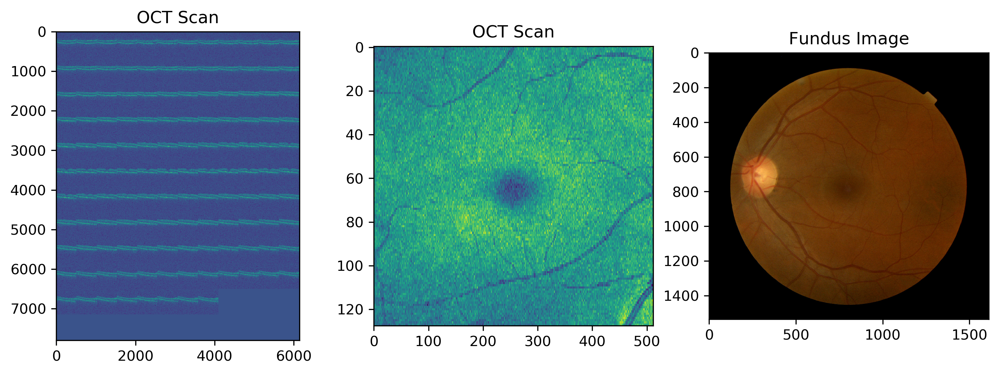

In [5]:
_, c_row = next(spie_data_df.sample(1).iterrows())
print(c_row)
spie_mat_read = lambda c_path: loadmat(c_path)['d3'].swapaxes(0,2).swapaxes(1,2)
oct_arr = spie_mat_read(c_row['mat'])
fund_img = imread(c_row['jpg'])
print('OCT Data',oct_arr.shape)
print('Fundus Data', fund_img.shape)
fig, (ax_oct, ax_mip, ax_fund) = plt.subplots(1, 3, figsize = (12, 4), dpi = 300)
ax_oct.imshow(montage2d(oct_arr))
ax_oct.set_title('OCT Scan')
ax_mip.imshow(np.mean(oct_arr,1))
ax_mip.set_title('OCT Scan')
ax_mip.set_aspect(4)
ax_fund.imshow(fund_img)
ax_fund.set_title('Fundus Image')
fig.savefig('oct_overview.png');

# Filtering
### We can try and remove the noise with a bit of median filtering

CPU times: user 39.1 s, sys: 694 ms, total: 39.8 s
Wall time: 40.3 s


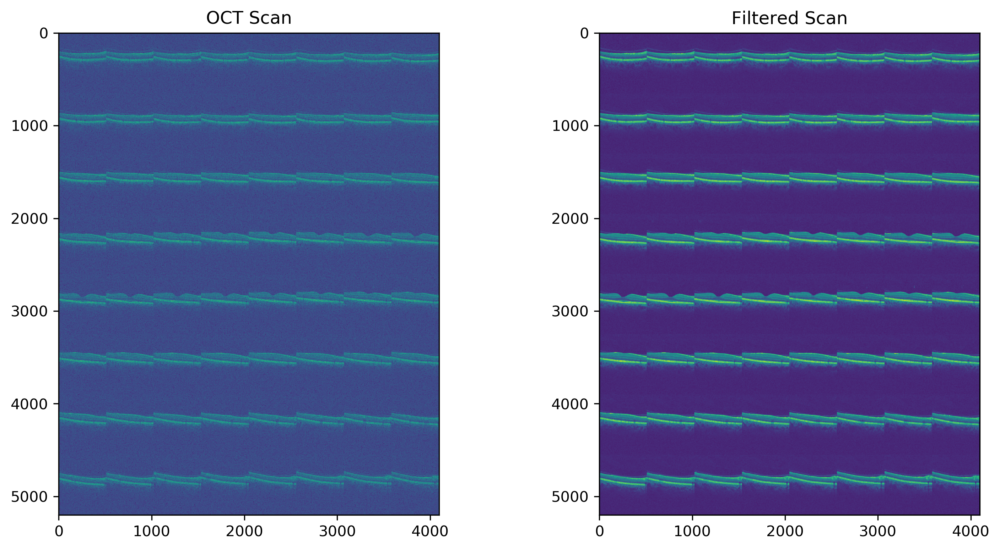

In [6]:
%%time
from scipy.ndimage import median_filter
oct_arr_filtered = median_filter(oct_arr, [3, 5, 5])
fig, (ax_oct, ax_fund) = plt.subplots(1, 2, figsize = (12, 6), dpi = 300)
ax_oct.imshow(montage2d(oct_arr[::2]))
ax_oct.set_title('OCT Scan')
ax_fund.imshow(montage2d(oct_arr_filtered[::2]))
ax_fund.set_title('Filtered Scan');

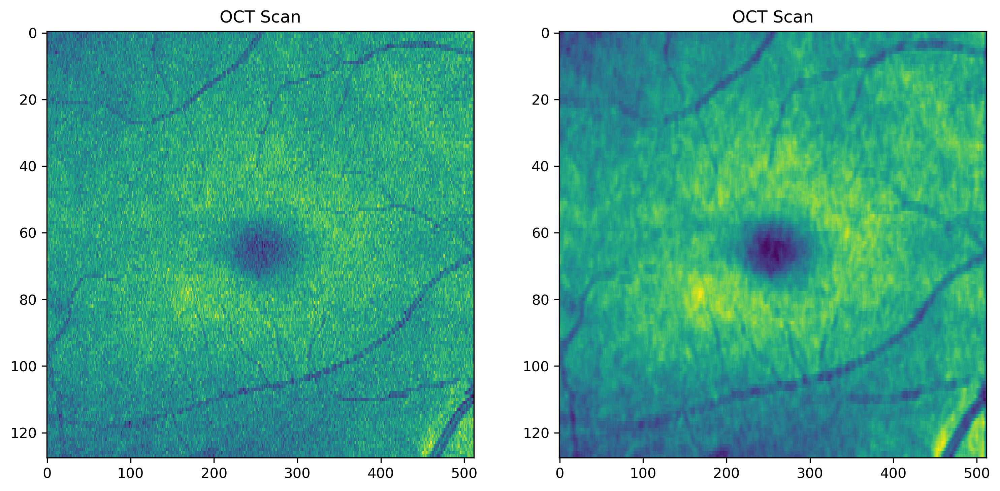

In [7]:
fig, (ax_mip, ax_mip_filt) = plt.subplots(1, 2, figsize = (12, 6), dpi = 300)

ax_mip.imshow(np.mean(oct_arr,1))
ax_mip.set_title('OCT Scan')
ax_mip.set_aspect(4)

ax_mip_filt.imshow(np.mean(oct_arr_filtered,1))
ax_mip_filt.set_title('OCT Scan')
ax_mip_filt.set_aspect(4)

# Segmentation of OCT
### Here we can apply some basic segmentation approaches to see if we can get any better results

/Users/vaishalilambe/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


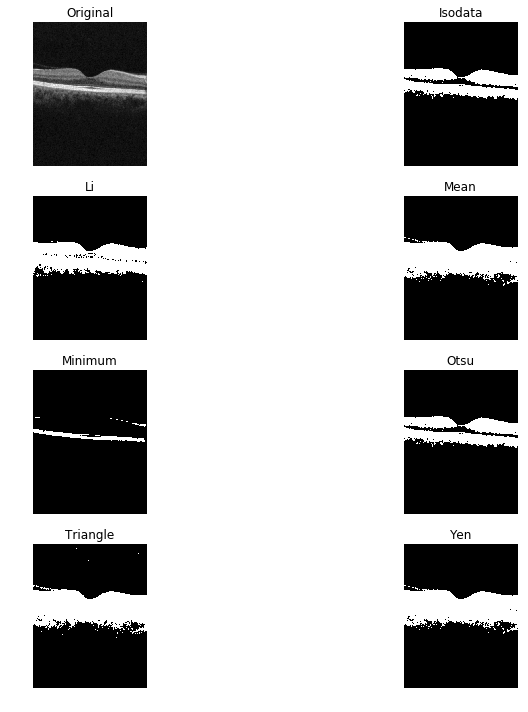

In [8]:
from skimage.filters import try_all_threshold
try_all_threshold(oct_arr_filtered[oct_arr_filtered.shape[0]//2], 
                  figsize=(14, 10), verbose = False);

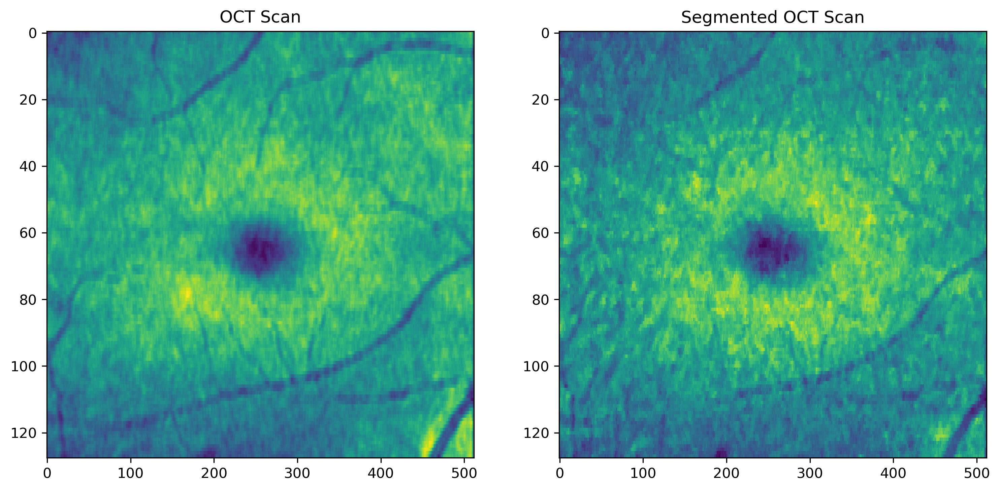

In [9]:
from skimage.filters import threshold_otsu
oct_arr_seg = oct_arr_filtered>threshold_otsu(oct_arr_filtered)

fig, (ax_mip, ax_mip_seg) = plt.subplots(1, 2, figsize = (12, 6), dpi = 300)
ax_mip.imshow(np.mean(oct_arr_filtered,1))
ax_mip.set_title('OCT Scan')
ax_mip.set_aspect(4)

ax_mip_seg.imshow(np.sum(oct_arr_seg,1))
ax_mip_seg.set_title('Segmented OCT Scan')
ax_mip_seg.set_aspect(4)

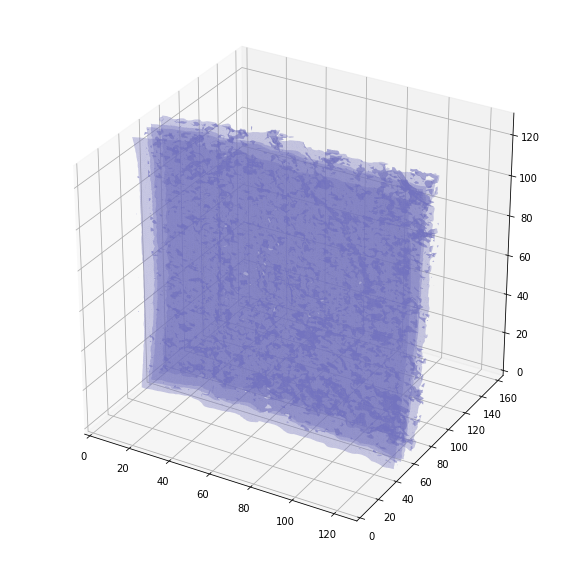

In [10]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from skimage import measure
def plot_3d(image, threshold=-300):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image#.transpose(2,1,0)
    
    verts, faces, _, _ = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.40)
    face_color = [0.45, 0.45, 0.75]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()
plot_3d(oct_arr_filtered[:, ::4, ::4], 
        threshold_otsu(oct_arr_filtered))


# Manually Labeled Regions
### Displaying the results from the newest study with manually segmented resuts

In [11]:
import string
oct_seg_df = pd.DataFrame(dict(seg_path = oct_seg))
oct_seg_df['file_id'] = oct_seg_df['seg_path'].map(lambda x: os.path.splitext(os.path.basename(x))[0])
oct_seg_df['case_id'] = oct_seg_df['file_id'].map(lambda x: x.split('_')[0])
oct_seg_df['condition'] = oct_seg_df['case_id'].map(lambda x: ''.join([y for y in x.lower()
                                                               if y in string.ascii_lowercase]))

oct_seg_df['grader'] = oct_seg_df['file_id'].map(lambda x: x.split('_')[1].lower())
oct_seg_df['img_path'] = oct_seg_df['case_id'].map(lambda x: [y for y in out_seg_images
                                                                if os.path.join(x, '') in y])
oct_seg_df = oct_seg_df[oct_seg_df.img_path.map(len)==1]
oct_seg_df['img_path'] = oct_seg_df['img_path'].map(lambda x: x[0])
print(oct_seg_df.shape[0], 'complete cases')
oct_seg_df.sample(3)

72 complete cases


,seg_path,file_id,case_id,condition,grader,img_path
65,/Users/vaishalilambe/Documents/DataScienceUsin...,mixed5_Grader2,mixed5,mixed,grader2,/Users/vaishalilambe/Documents/DataScienceUsin...
34,/Users/vaishalilambe/Documents/DataScienceUsin...,focal4_Grader1_reseg,focal4,focal,grader1,/Users/vaishalilambe/Documents/DataScienceUsin...
18,/Users/vaishalilambe/Documents/DataScienceUsin...,diffuse7_Grader1,diffuse7,diffuse,grader1,/Users/vaishalilambe/Documents/DataScienceUsin...


seg_path     /Users/vaishalilambe/Documents/DataScienceUsin...
file_id                                   mixed7_Grader1_reseg
case_id                                                 mixed7
condition                                                mixed
grader                                                 grader1
img_path     /Users/vaishalilambe/Documents/DataScienceUsin...
Name: 70, dtype: object


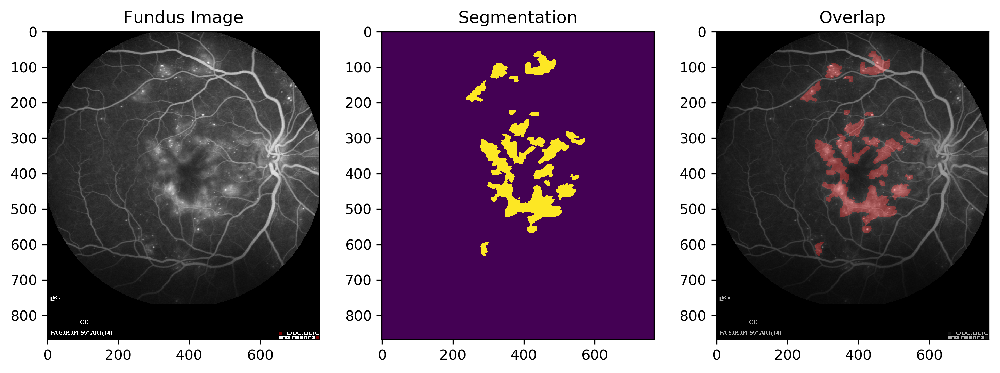

In [12]:
from skimage.color import label2rgb
_, c_row = next(oct_seg_df.sample(1).iterrows())
print(c_row)
fund_img = imread(c_row['img_path'])
seg_img = imread(c_row['seg_path'])
fig, (ax_fund, ax_seg, ax_overlap) = plt.subplots(1, 3, figsize = (12, 4), dpi = 300)
ax_seg.imshow(seg_img)
ax_seg.set_title('Segmentation')
ax_fund.imshow(fund_img)
ax_fund.set_title('Fundus Image')
ax_overlap.imshow(label2rgb(seg_img>0, fund_img, bg_label = 0))
ax_overlap.set_title('Overlap')
fig.savefig('seg_overview.png');

# Various Eye Diseases
### Here we show one example from each condition

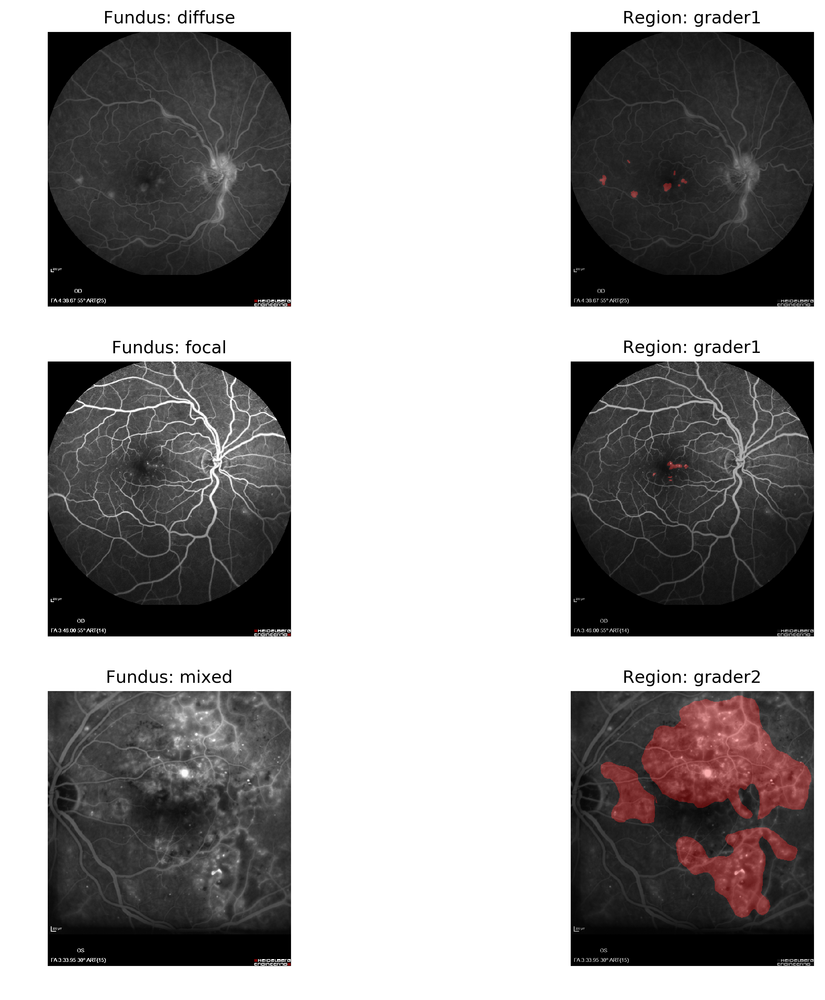

In [13]:
sample_df = oct_seg_df.groupby('condition').apply(lambda x: x.sample(1)).reset_index(drop = True)
fig, m_axs = plt.subplots(sample_df.shape[0], 2, 
                          figsize = (12, 4*sample_df.shape[0]), dpi = 300)
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax_fund, ax_overlap), (_, c_row) in zip(m_axs, sample_df.iterrows()):
    fund_img = imread(c_row['img_path'])
    seg_img = imread(c_row['seg_path'])
    ax_fund.imshow(fund_img)
    ax_fund.set_title('Fundus: {condition}'.format(**c_row))
    ax_overlap.imshow(label2rgb(seg_img>0, fund_img, bg_label = 0))
    ax_overlap.set_title('Region: {grader}'.format(**c_row))
    fig.savefig('eye_overview.png');